# Column detection results

This notebook analyses the results of running the column detection script across all of the Stock Exchange images on CloudStor.

The raw results are in CSV files, one for each year. See [this notebook](find-image-sizes-and-columns-by-year.ipynb) for more details.

In [32]:
import pandas as pd
import os

In [33]:
# We're going to combin all of the CSV files into one big dataframe

# Create an empty dataframe
combined_df = pd.DataFrame()

# Loop through the range of years
for year in range(1901, 1951):
    
    # Open the CSV file for that year as a dataframe
    year_df = pd.read_csv('{}.csv'.format(year))
    
    # Add the single year df to the combined df
    combined_df = combined_df.append(year_df)

In [34]:
# How many images do we have data for?
combined_df.shape

(72932, 11)

In [35]:
# Have a look inside
combined_df.head()

,directory,name,path,referenceCode,startDate,endDate,year,width,height,columns,column_positions
0,AU NBAC N193-001/,N193-001_0001.tif,Shared/ANU-Library/Sydney Stock Exchange 1901-...,N193-001,1901-01-01,1901-03-01,1901,6237,5000,3,"0,1811,3222"
1,AU NBAC N193-001/,N193-001_0002.tif,Shared/ANU-Library/Sydney Stock Exchange 1901-...,N193-001,1901-01-01,1901-03-01,1901,6266,5000,3,"205,1840,3259"
2,AU NBAC N193-001/,N193-001_0003.tif,Shared/ANU-Library/Sydney Stock Exchange 1901-...,N193-001,1901-01-01,1901-03-01,1901,6237,5000,2,"286,2068"
3,AU NBAC N193-001/,N193-001_0004.tif,Shared/ANU-Library/Sydney Stock Exchange 1901-...,N193-001,1901-01-01,1901-03-01,1901,6236,5000,3,"9,1821,3219"
4,AU NBAC N193-001/,N193-001_0005.tif,Shared/ANU-Library/Sydney Stock Exchange 1901-...,N193-001,1901-01-01,1901-03-01,1901,6236,5000,3,"288,1821,3220"


In [5]:
combined_df['columns'].value_counts()

3    41076
4    26917
2     4825
1       19
0        6
Name: columns, dtype: int64

In [6]:
combined_df.loc[combined_df['width'] == 0]

,directory,name,path,referenceCode,startDate,endDate,year,width,height,columns,column_positions
677,AU NBAC N193-055/,N193-055_0037.tif,Shared/ANU-Library/Sydney Stock Exchange 1901-...,N193-055,1914-07-01,1914-09-01,1914,0,0,0,NaN
1051,AU NBAC N193-064/,N193-064_0078.tif,Shared/ANU-Library/Sydney Stock Exchange 1901-...,N193-064,1916-10-01,1916-12-01,1916,0,0,0,NaN
44,AU NBAC N193-173/,N193-173_0045.tif,Shared/ANU-Library/Sydney Stock Exchange 1901-...,N193-173,1944-01-01,1944-03-01,1944,0,0,0,NaN
50,AU NBAC N193-173/,N193-173_0051.tif,Shared/ANU-Library/Sydney Stock Exchange 1901-...,N193-173,1944-01-01,1944-03-01,1944,0,0,0,NaN
52,AU NBAC N193-173/,N193-173_0053.tif,Shared/ANU-Library/Sydney Stock Exchange 1901-...,N193-173,1944-01-01,1944-03-01,1944,0,0,0,NaN
65,AU NBAC N193-173/,N193-173_0066.tif,Shared/ANU-Library/Sydney Stock Exchange 1901-...,N193-173,1944-01-01,1944-03-01,1944,0,0,0,NaN


## Pages with 0 or 1 columns detected

There are 25 pages with 0 or 1 columns detected. Let's see what's up with them...

In [7]:
# Get the problem pages
problems = combined_df.loc[(combined_df['columns'] == 0) | (combined_df['columns'] == 1)]
problems

,directory,name,path,referenceCode,startDate,endDate,year,width,height,columns,column_positions
677,AU NBAC N193-055/,N193-055_0037.tif,Shared/ANU-Library/Sydney Stock Exchange 1901-...,N193-055,1914-07-01,1914-09-01,1914,0,0,0,NaN
1051,AU NBAC N193-064/,N193-064_0078.tif,Shared/ANU-Library/Sydney Stock Exchange 1901-...,N193-064,1916-10-01,1916-12-01,1916,0,0,0,NaN
515,AU NBAC N193-090/,N193-090_0210.tif,Shared/ANU-Library/Sydney Stock Exchange 1901-...,N193-090,1923-04-01,1923-06-01,1923,4264,5000,1,355
330,AU NBAC N193-109/,N193-109_0331.tif,Shared/ANU-Library/Sydney Stock Exchange 1901-...,N193-109,1928-01-01,1928-03-01,1928,4032,5000,1,26
856,AU NBAC N193-111/,N193-111_0216.tif,Shared/ANU-Library/Sydney Stock Exchange 1901-...,N193-111,1928-07-01,1928-09-01,1928,5732,5000,1,12
1590,AU NBAC N193-163/,N193-163_0427.tif,Shared/ANU-Library/Sydney Stock Exchange 1901-...,N193-163,1941-07-01,1941-09-01,1941,3642,2464,1,0
44,AU NBAC N193-173/,N193-173_0045.tif,Shared/ANU-Library/Sydney Stock Exchange 1901-...,N193-173,1944-01-01,1944-03-01,1944,0,0,0,NaN
50,AU NBAC N193-173/,N193-173_0051.tif,Shared/ANU-Library/Sydney Stock Exchange 1901-...,N193-173,1944-01-01,1944-03-01,1944,0,0,0,NaN
52,AU NBAC N193-173/,N193-173_0053.tif,Shared/ANU-Library/Sydney Stock Exchange 1901-...,N193-173,1944-01-01,1944-03-01,1944,0,0,0,NaN
65,AU NBAC N193-173/,N193-173_0066.tif,Shared/ANU-Library/Sydney Stock Exchange 1901-...,N193-173,1944-01-01,1944-03-01,1944,0,0,0,NaN


In [9]:
# If running locally need to set up Cloudstor client to download images
# DON'T RUN THIS ON SWAN (or you'll get an error because webdav is not installed)
import webdav.client as wc
from webdav.client import RemoteResourceNotFound
from credentials import * # Storing my CloudStor credentials in another file
# Set the connection options. CLOUDSTOR_USER and CLOUDSTOR_PW are stored in a separate credentials file.
options = {
    'webdav_hostname': 'https://cloudstor.aarnet.edu.au',
    'webdav_login':    CLOUDSTOR_USER,
    'webdav_password': CLOUDSTOR_PW,
    'webdav_root': '/plus/remote.php/webdav/'
}
# Ok let's initiate the client.
client = wc.Client(options)
from PIL import Image

In [10]:
def download_image(image):
    try:
        client.download_sync(remote_path=image.path, local_path='problems/{}'.format(image.name))
    except RemoteResourceNotFound:
        print('Not found: {}'.format(image.name))
    else:
        filename, ext = os.path.splitext(image.name)
        if os.path.getsize('problems/{}'.format(image.name)) > 3000000:
            img = Image.open('problems/{}'.format(image.name))
            img.thumbnail((1000,1000), resample=Image.LANCZOS)
            img.save('problems/{}.jpg'.format(filename))
        else:
            print('Small: {}'.format(image.name))
        
for row in problems.itertuples():
    if not os.path.exists('problems/{}'.format(row.name)):
        download_image(row)

Not found: N193-055_0037.tif


Note that 6 of the pages have no width or height recorded. This means that the script couldn't open the images. I manually checked these:

* N193-055_0037.tif – only 31mb, seems to be compressed (also has a .tiff file extension)
* N193-064_0078.tif – seems ok
* N193-173_0045.tif – seems ok
* N193-173_0051.tif – seems ok
* N193-173_0053.tif – seems ok
* N193-173_0066.tif – seems ok

I downloaded the 5 that seemed ok, and ran the column detection script on them and the results were as expected. So I think there must have been some temporary problem on CloudStor when the script tried to access them.

I downloaded the rest and all of them were either rotated, or not the usual page format. These rotated:

* N193-090_0210.tif
* N193-109_0331.tif

Others:

* N193-111_0216.tif – back of page
* N193-163_0427.tif – page of publication

All the rest from `N193-173` are hand-written register pages.

So, in summary, the column detector script seems to have worked as expected on all of these.

## Check volume stats and sequences

In [27]:
import altair as alt
from IPython.display import display, HTML
alt.renderers.enable('notebook')
alt.data_transformers.enable('json')

DataTransformerRegistry.enable('json')

In [28]:
combined_df['column_positions'].fillna('0', inplace=True)
vol_groups = combined_df.groupby('referenceCode')
df_volumes = pd.DataFrame()
max_rows = 200
row = 0
for vol, pages in vol_groups:
    # display(HTML('<b>{}</b>'.format(vol)))
    if row < max_rows:
        pages = pages.copy()
        pages['page_num'] = pages['name'].str.extract(r'_(\d+)\.').astype('int')
        pages = pages.sort_values(by='page_num')
        pages['width'] = pages['width'].astype('str')
        pages['column_positions'] = pages[['column_positions', 'width']].apply(lambda x: ','.join(x), axis=1)
        # pages['page_num'] = pages['col_pos'].astype('int')
        # display(pages['column_positions'].str.split(',', expand=True))
        new_df = pd.DataFrame(pages['column_positions'].str.split(',').tolist(), index=pages['page_num']).stack()
        new_df = new_df.reset_index([0, 'page_num'])
        new_df.columns = ['page_num', 'col_pos']
        new_df['col_pos'] = new_df['col_pos'].astype('int')
        
        # Number the columns in each row
        new_df['order'] = new_df.groupby('page_num').cumcount()
        new_df['volume'] = vol
        new_df['volume_num'] = int(vol[-3:])
        for i in range(1, len(new_df)):
            if new_df.loc[i, 'order'] == 0:
                new_df.loc[i, 'col_width'] = new_df.loc[i, 'col_pos']
            else:
                new_df.loc[i, 'col_width'] = new_df.loc[i, 'col_pos'] - new_df.loc[i-1, 'col_pos']
        df_volumes = df_volumes.append(new_df)
    row += 1

In [29]:
df_volumes.head()

,page_num,col_pos,order,volume,volume_num,col_width
0,1,0,0,N193-001,1,NaN
1,1,1811,1,N193-001,1,1811.0
2,1,3222,2,N193-001,1,1411.0
3,1,6237,3,N193-001,1,3015.0
4,2,205,0,N193-001,1,205.0
5,2,1840,1,N193-001,1,1635.0
6,2,3259,2,N193-001,1,1419.0
7,2,6266,3,N193-001,1,3007.0
8,3,286,0,N193-001,1,286.0
9,3,2068,1,N193-001,1,1782.0


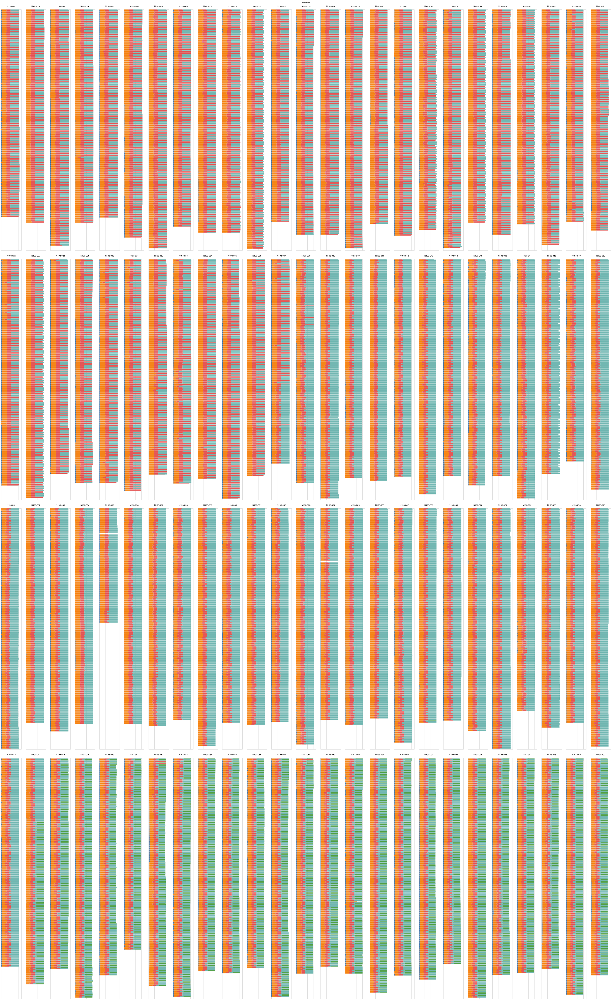

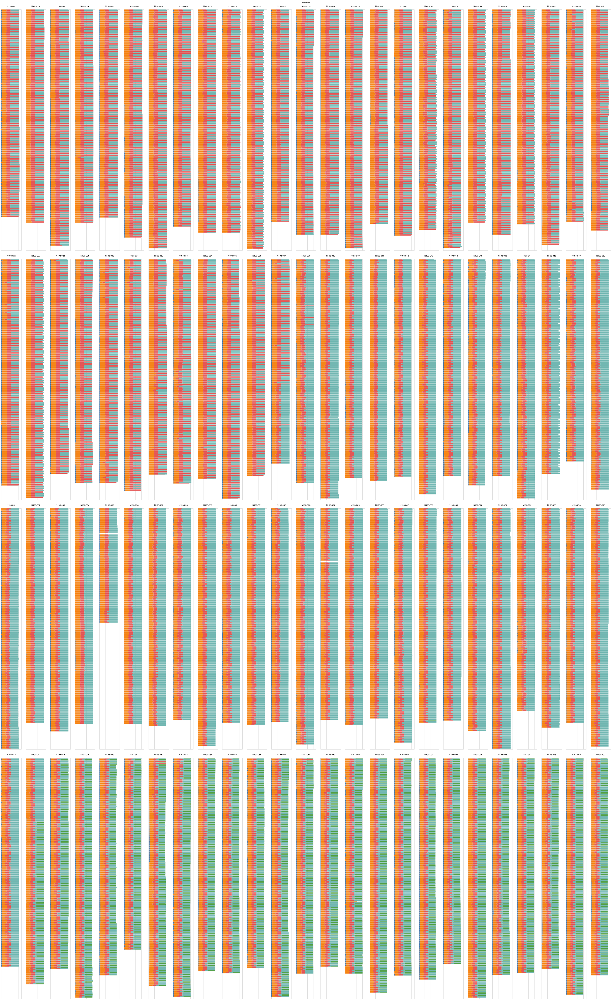

In [30]:
alt.Chart(df_volumes.loc[df_volumes['volume_num'] <= 100]).mark_bar(size=3).encode(
    y=alt.X('page_num:O', axis=alt.Axis(labels=False, ticks=False), title='', scale=alt.Scale(rangeStep=3.4)),
    x=alt.Y('col_width:Q', axis=alt.Axis(labels=False, ticks=False), title=''),
    color=alt.Color('order:N', legend=None),
    tooltip=['volume', 'page_num', 'col_width'],
    order=alt.Order(
      # Sort the segments of the bars by this field
      'order',
      sort='ascending'
    )
).properties(width=100).facet(
    facet='volume:N',
    columns=25
)

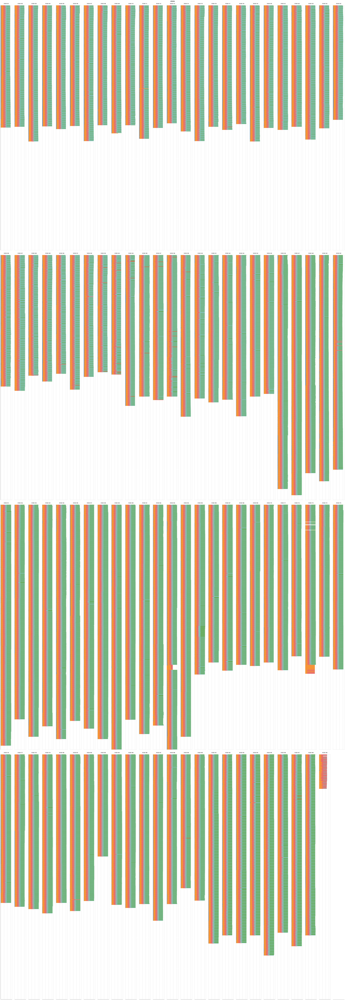

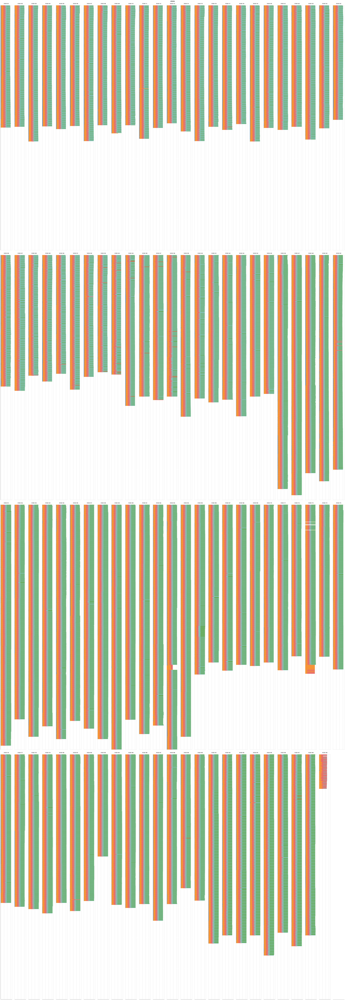

In [31]:
alt.Chart(df_volumes.loc[df_volumes['volume_num'] > 100]).mark_bar(size=3).encode(
    y=alt.X('page_num:O', axis=alt.Axis(labels=False, ticks=False), title='', scale=alt.Scale(rangeStep=3.4)),
    x=alt.Y('col_width:Q', axis=alt.Axis(labels=False, ticks=False), title=''),
    color=alt.Color('order:N', legend=None),
    tooltip=['volume', 'page_num', 'col_width'],
    order=alt.Order(
      # Sort the segments of the bars by this field
      'order',
      sort='ascending'
    )
).properties(width=100).facet(
    facet='volume:N',
    columns=25
)

In [ ]:
#display(new_df)
chart = alt.Chart(df_volumes).mark_bar(size=2.6).encode(
    x=alt.X('name:O', axis=alt.Axis(labels=False, ticks=False), title='', scale=alt.Scale(rangeStep=3)),
    y=alt.Y('col_pos:Q', axis=alt.Axis(labels=False, ticks=False), stack='normalize', title=''),
    color=alt.Color('order:N', legend=None),
    order=alt.Order(
      # Sort the segments of the bars by this field
      'order',
      sort='ascending'
    )
).properties(height=100)
display(chart)
    break

In [17]:
df_change = pd.read_csv('1901.csv')
df_change['columns'] = df_change['columns'] - 1
df_change.to_csv('1901.csv', index=False)

In [14]:
df_change['columns'].value_counts()

3    755
2    517
Name: columns, dtype: int64

In [16]:
combined_df.loc[combined_df['year'] == 1901]['referenceCode'].value_counts()

N193-003    345
N193-004    312
N193-002    312
N193-001    303
Name: referenceCode, dtype: int64